# Data loading

In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import LabelEncoder

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


In [35]:
dt = pd.read_csv('./Clean_Dataset.csv')
dt = dt.drop('Unnamed: 0', axis = 1)
dt.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955


# Data Preprocessing (EDA)

In [36]:
cat = ['airline','source_city', 'departure_time', 'stops','arrival_time', 'destination_city', 'class']
cont  = ['duration', 'days_left']

In [37]:
dt.isnull().sum()

airline             0
flight              0
source_city         0
departure_time      0
stops               0
arrival_time        0
destination_city    0
class               0
duration            0
days_left           0
price               0
dtype: int64

In [38]:
dt.shape

(300153, 11)

In [39]:
for i in cat:
    print(dt[i].unique())

['SpiceJet' 'AirAsia' 'Vistara' 'GO_FIRST' 'Indigo' 'Air_India']
['Delhi' 'Mumbai' 'Bangalore' 'Kolkata' 'Hyderabad' 'Chennai']
['Evening' 'Early_Morning' 'Morning' 'Afternoon' 'Night' 'Late_Night']
['zero' 'one' 'two_or_more']
['Night' 'Morning' 'Early_Morning' 'Afternoon' 'Evening' 'Late_Night']
['Mumbai' 'Bangalore' 'Kolkata' 'Hyderabad' 'Chennai' 'Delhi']
['Economy' 'Business']


In [40]:
#Making a copy of original dataset.
data_copy = dt.copy()


In [41]:
mapping = {'one': 1, 'zero': 0, 'two_or_more': 2}
replace_func = np.vectorize(lambda x: mapping.get(x, -1))

dt['stops'] = replace_func(dt['stops'])
dt['stops']


0         0
1         0
2         0
3         0
4         0
         ..
300148    1
300149    1
300150    1
300151    1
300152    1
Name: stops, Length: 300153, dtype: int32

In [42]:
dt.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,0,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,0,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,0,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,0,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,0,Morning,Mumbai,Economy,2.33,1,5955


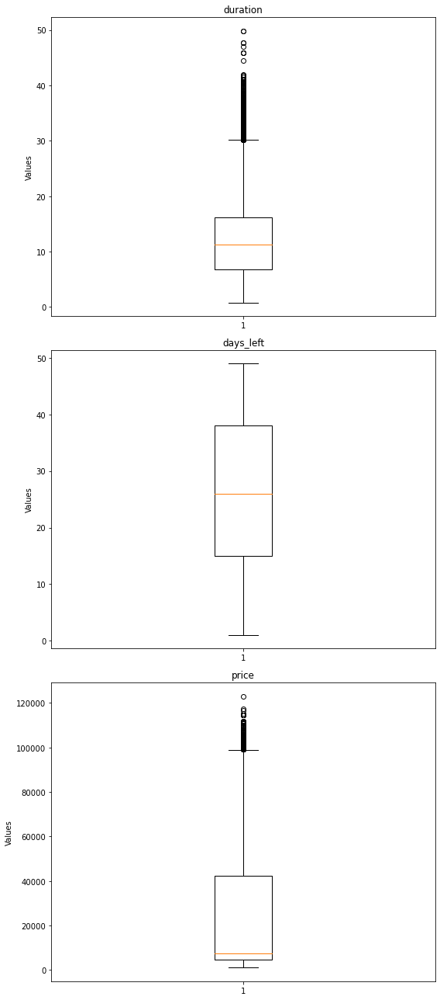

In [45]:
fig, axes = plt.subplots(nrows=len(dt[['duration', 'days_left', 'price']].columns), figsize=(8, 6 * len(dt[['duration', 'days_left', 'price']].columns)))

for i, column in enumerate(dt[['duration', 'days_left', 'price']].columns):
    axes[i].boxplot(dt[['duration', 'days_left', 'price']][column])
    axes[i].set_title(column)
    axes[i].set_ylabel('Values')

plt.tight_layout()
plt.show()

In [47]:
le = LabelEncoder()

#for i in cat:
#    dt[i] = le.fit_transform(dt[i])
cat1 = dt['airline']
airline_ecode = le.fit_transform(cat1)

# Get the unique labels
unique_labels1 = le.classes_

# Print the original categories and their corresponding labels
p = 0
for category, label in zip(cat1, airline_ecode):
    print(f"Category: {category} -> Label: {label} -> Encoded Category: {airline_ecode[label]}")
    p += 1
    if p == 1000:
        break
#['AirAsia' 'Air_India' 'GO_FIRST' 'Indigo' 'SpiceJet' 'Vistara']

Category: SpiceJet -> Label: 4 -> Encoded Category: 5
Category: SpiceJet -> Label: 4 -> Encoded Category: 5
Category: AirAsia -> Label: 0 -> Encoded Category: 4
Category: Vistara -> Label: 5 -> Encoded Category: 5
Category: Vistara -> Label: 5 -> Encoded Category: 5
Category: Vistara -> Label: 5 -> Encoded Category: 5
Category: Vistara -> Label: 5 -> Encoded Category: 5
Category: Vistara -> Label: 5 -> Encoded Category: 5
Category: GO_FIRST -> Label: 2 -> Encoded Category: 0
Category: GO_FIRST -> Label: 2 -> Encoded Category: 0
Category: GO_FIRST -> Label: 2 -> Encoded Category: 0
Category: GO_FIRST -> Label: 2 -> Encoded Category: 0
Category: Indigo -> Label: 3 -> Encoded Category: 5
Category: Indigo -> Label: 3 -> Encoded Category: 5
Category: Indigo -> Label: 3 -> Encoded Category: 5
Category: Indigo -> Label: 3 -> Encoded Category: 5
Category: Air_India -> Label: 1 -> Encoded Category: 4
Category: Air_India -> Label: 1 -> Encoded Category: 4
Category: AirAsia -> Label: 0 -> Encoded

In [38]:
cat2 = dt['source_city']
city_ecode = le.fit_transform(cat2)

# Get the unique labels
unique_labels2 = le.classes_

# Print the original categories and their corresponding labels
for category, label in zip(cat2, dt['source_city']):
    print(f"Category: {category} -> Label: {label} -> Encoded Category: {dt['source_city'][label]}")
#['Banglore' 'Chennai1' 'Delhi2' 'Hyderabad' 'Kolkata4' 'Mumbai5']
#['Afternoon' 'Early_Morning' 'Evening' 'Late_Night' 'Morning'  'Night']

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Cate

Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Categ

Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Categ

Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Categ

Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Categ

Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Categ

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Categ

Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Categ

Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Categ

Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Categ

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> Encoded Category: 2
Category: Delhi -> Label: 2 -> 

Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mumbai -> Label: 5 -> Encoded Category: 2
Category: Mu

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: Bangalore -> Label: 0 -> Encoded Category: 2
Category: 

Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Categ

Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Categ

Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Categ

Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Category: 2
Category: Kolkata -> Label: 4 -> Encoded Categ

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: Hyderabad -> Label: 3 -> Encoded Category: 2
Category: 

Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Categ

Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Categ

Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Categ

Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Category: 2
Category: Chennai -> Label: 1 -> Encoded Categ

In [48]:
le = LabelEncoder()

for i in cat:
    dt[i] = le.fit_transform(dt[i])

In [49]:
dt.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,4,SG-8709,2,2,0,5,5,1,2.17,1,5953
1,4,SG-8157,2,1,0,4,5,1,2.33,1,5953
2,0,I5-764,2,1,0,1,5,1,2.17,1,5956
3,5,UK-995,2,4,0,0,5,1,2.25,1,5955
4,5,UK-963,2,4,0,4,5,1,2.33,1,5955


# Feature Analysis

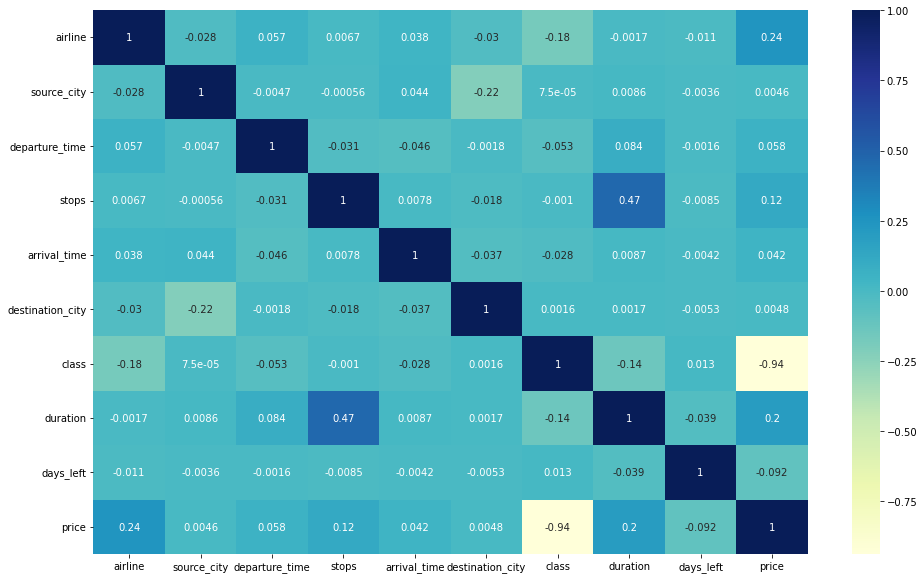

In [50]:
# importing required libraries

import matplotlib.pyplot as plt
import seaborn as sns
# plot heatmap to check the correlation coefficients

plt.figure(figsize = (16, 10))
sns.heatmap(dt.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [51]:
#Assign x and Y
dt = dt.drop('flight', axis = 1)
x = dt.drop('price', axis = 1)
y = dt['price']


In [52]:
#split the data
from sklearn.preprocessing import StandardScaler, MinMaxScaler
sc = StandardScaler()
mc = MinMaxScaler()
xtrain, xtest, ytrain, ytest = train_test_split(x,y, test_size=0.25, random_state=42)

In [53]:
#Standard scaled varibles
xtrain2, xtest2 = xtrain, xtest
xtrain2[cont] = sc.fit_transform(xtrain[cont])
xtest2[cont] = sc.transform(xtest[cont])
#Minmaxscaled Variables
xtrain3, xtest3 = xtrain, xtest
xtrain3[cont] = sc.fit_transform(xtrain[cont])
xtest3[cont] = sc.transform(xtest[cont])

# Base Linear Regression Model

In [55]:
#Linear Regression Model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

model = LinearRegression()
model.fit(xtrain,ytrain)
ypred = model.predict(xtest)

print()
print('Coeffcients are Feature Importance')
print()
coeff_table2=pd.DataFrame(np.transpose(model.coef_),dt.drop('price',axis=1).columns,columns=['Coefficients'])
print(coeff_table2)
print('Accuracy',r2_score(ytest, ypred))
print('MSE',mean_squared_error(ytest,ypred))
print('MAE',mean_absolute_error(ytest,ypred))


Coeffcients are Feature Importance

                  Coefficients
airline             956.804268
source_city         114.845901
departure_time       85.675928
stops              6131.711268
arrival_time        162.778615
destination_city    161.244960
class            -45051.950215
duration            528.015181
days_left         -1750.367520
Accuracy 0.9065130455732191
MSE 48203557.82959329
MAE 4528.255586950062


In [70]:
#Linear Regression Model(Scaled)
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

model = LinearRegression()
model.fit(xtrain3,ytrain)
ypred = model.predict(xtest3)

print()
print('Coeffcients are Feature Importance')
print()
coeff_table2=pd.DataFrame(np.transpose(model.coef_),dt.drop('price',axis=1).columns,columns=['Coefficients'])
print(coeff_table2)
print('Accuracy',r2_score(ytest, ypred))
print('MSE',mean_squared_error(ytest,ypred))
print('MAE',mean_absolute_error(ytest,ypred))


Coeffcients are Feature Importance

                  Coefficients
airline             956.804268
source_city         114.845901
departure_time       85.675928
stops              6131.711268
arrival_time        162.778615
destination_city    161.244960
class            -45051.950215
duration            528.015181
days_left         -1750.367520
Accuracy 0.9065130455732191
MSE 48203557.82959329
MAE 4528.255586950062


# Feature Elimination with RFE

In [56]:
from sklearn.feature_selection import RFE
import re
for i in range(3,11):

    rfe = RFE(model, n_features_to_select=i)

    # Fit RFE to the data and transform the data to include only the selected features
    X_rfe = rfe.fit_transform(xtrain, ytrain)

    # Get the selected feature names
    selected_feature_names = xtrain.columns[rfe.support_]

# Print the selected feature names
    df2 = dt[list(selected_feature_names) + ['price']]
    df2_train = xtrain[selected_feature_names]
    df2_test = xtest[selected_feature_names]
    model0 = LinearRegression()
    x_train2 = df2_train
    x_test2 = df2_test
    model0.fit(x_train2,ytrain)
    y_pred2 = model0.predict(x_test2)
    print(i,r2_score(ytest, y_pred2))

3 0.9000639177810631
4 0.9057052908525777
5 0.9061079898983379
6 0.9062790145317721
7 0.906396444564097
8 0.9064594185472946
9 0.9065130455732191
10 0.9065130455732191


Accuracy with each number of feature is shown, having more feature gives the best accuracy.
Next, lets try PCA to improve our accuracy

# Principle Component Analysis 

In [63]:
#try PCA
from sklearn.decomposition import PCA
n_components = 3
# Choose the number of principal components
pca = PCA(n_components=n_components)
Xtrain = pca.fit_transform(xtrain)
Xtest = pca.transform(xtest)


In [64]:
#Accuracy for multiple number of pca
for i in range(2,9):
    n_components = i
    # Choose the number of principal components
    pca = PCA(n_components=n_components)
    Xtrain = pca.fit_transform(xtrain)
    Xtest = pca.transform(xtest)
    model = LinearRegression()
    model.fit(Xtrain,ytrain)
    ypred = model.predict(Xtest)
    print(i,'Accuracy',r2_score(ytest, ypred))
    print('MSE',mean_squared_error(ytest,ypred))
    print('MAE',mean_absolute_error(ytest,ypred))


2 Accuracy 0.06707787484499306
MSE 481031453.91945696
MAE 18808.92391165793
3 Accuracy 0.06847586280175189
MSE 480310626.14480233
MAE 18793.66486440924
4 Accuracy 0.06868566410077903
MSE 480202448.81554407
MAE 18789.520745736234
5 Accuracy 0.07121277997059428
MSE 478899422.34816533
MAE 18769.81872030884
6 Accuracy 0.12794491928756324
MSE 449647309.31132585
MAE 17997.805866051465
7 Accuracy 0.13121623450545605
MSE 447960560.2536482
MAE 17913.48292806168
8 Accuracy 0.8725188518173815
MSE 65731576.52083536
MAE 5401.338226185511


# Polynomial Regression Model

In [21]:
#with normal data
degree = 2  # Set the degree of the polynomial
poly_features = PolynomialFeatures(degree=degree)
x_poly = poly_features.fit_transform(xtrain)
x_polyt = poly_features.fit_transform(xtest)

# Create and fit the polynomial regression model
model = LinearRegression()
model.fit(x_poly, ytrain)

# Make predictions
y_pred = model.predict(x_polyt)

# Calculate Mean Squared Error
mse = mean_squared_error(ytest, y_pred)
print(f"Mean Squared Error: {mse:.2f}")
r2 = r2_score(ytest, y_pred)
print(f"R-squared (R2): {r2:}")
for i in range(3,11):

    rfe = RFE(model, n_features_to_select=i)

    # Fit RFE to the data and transform the data to include only the selected features
    X_rfe = rfe.fit_transform(xtrain, ytrain)

    # Get the selected feature names
    selected_feature_names = xtrain.columns[rfe.support_]

# Print the selected feature names
    df2 = dt[list(selected_feature_names) + ['price']]
    df2_train = xtrain[selected_feature_names]
    df2_test = xtest[selected_feature_names]
    model0 = LinearRegression()
    x_train2 = df2_train
    x_test2 = df2_test
    x_poly = poly_features.fit_transform(x_train2)
    x_polyt = poly_features.fit_transform(x_test2)
    model0.fit(x_poly,ytrain)
    y_pred2 = model0.predict(x_polyt)
    print(i,r2_score(ytest, y_pred2))

Mean Squared Error: 31309463.46
R-squared (R2): 0.9392777936815676
3 0.9256064505583057
4 0.9352429378163044
5 0.9361814874138129
6 0.9369433526084687
7 0.9379326873333468
8 0.939036486668647
9 0.9392777936815676
10 0.9392777936815676


Recursive Feature Elimination Method

In [65]:
rfe = RFE(model0, n_features_to_select=9)

# Fit RFE to the data and transform the data to include only the selected features
X_rfe = rfe.fit_transform(xtrain, ytrain)

    # Get the selected feature names
selected_feature_names = xtrain.columns[rfe.support_]

# Print the selected feature names
df2 = dt[list(selected_feature_names) + ['price']]
df2_train = xtrain[selected_feature_names]
df2_test = xtest[selected_feature_names]
model0 = LinearRegression()
x_train2 = df2_train
x_test2 = df2_test
x_poly = poly_features.fit_transform(x_train2)
x_polyt = poly_features.transform(x_test2)
model0.fit(x_poly,ytrain)
y_pred2 = model0.predict(x_polyt)
print(r2_score(ytest, y_pred2))
print('Accuracy',r2_score(ytest, y_pred2))
print('MSE',mean_squared_error(ytest,y_pred2))
print('MAE',mean_absolute_error(ytest,y_pred2))
# Get the coefficients
coefficients = pd.DataFrame({'Variable': poly_features.get_feature_names(x_train2.columns), 'Coefficient': model0.coef_})
print(selected_feature_names)
# Print the coefficients
print(coefficients)

0.9392777936815676
Accuracy 0.9392777936815676
MSE 31309463.462129388
MAE 3500.9333692442806
Index(['airline', 'source_city', 'departure_time', 'stops', 'arrival_time',
       'destination_city', 'class', 'duration', 'days_left'],
      dtype='object')
                           Variable   Coefficient
0                                 1 -8.662355e-13
1                           airline  4.673474e+02
2                       source_city -5.162890e+02
3                    departure_time  6.904706e+02
4                             stops  2.107141e+04
5                      arrival_time  8.251943e+02
6                  destination_city -6.612092e+02
7                             class  3.470920e+15
8                          duration  7.410381e+02
9                         days_left -4.765938e+02
10                        airline^2 -5.125000e+00
11              airline source_city  1.421250e+02
12           airline departure_time -8.312500e+00
13                    airline stops  7.449141e+

C:\Users\meckw\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


# Decision Tree Regressor Model

In [67]:
from sklearn.tree import DecisionTreeRegressor
dtree = DecisionTreeRegressor(max_depth=5, min_samples_split=10)
dtree.fit(xtrain,ytrain)
ypred = dtree.predict(xtest)
print(r2_score(ypred,ytest))
print('MSE',mean_squared_error(ytest,ypred))
print('MAE',mean_absolute_error(ytest,ypred))

0.9406152163099186
MSE 28986418.27828135
MAE 3209.4176608068724


In [24]:
#Grid Search Cv
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold
param_grid = {
    'max_depth': [None, 5, 10],
    'min_samples_split': [5, 10],
    'min_samples_leaf': [1, 2]
}
# Perform grid search with cross-validation
grid_search = GridSearchCV(dtree, param_grid, cv=5, n_jobs=-1)
grid_search.fit(xtrain, ytrain)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

# Get the best model from grid search
best_dt_model = grid_search.best_estimator_

# Evaluate the model on the test set
test_score = best_dt_model.score(xtest, ytest)
print("Test Score:", test_score)

Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10}
Best Score: 0.9817866741454084
Test Score: 0.9817118308884664


In [68]:
#Refined Model
dtree2 = DecisionTreeRegressor(max_depth=None, min_samples_split=10, min_samples_leaf= 2)
dtree2.fit(xtrain,ytrain)
ypred = dtree2.predict(xtest)
print(r2_score(ypred,ytest))
print('MSE',mean_squared_error(ytest,ypred))
print('MAE',mean_absolute_error(ytest,ypred))

0.981586516159797
MSE 9431272.213524247
MAE 1177.5261845956504


# Ensemble Models

In [29]:
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import AdaBoostRegressor
base_regressor = DecisionTreeRegressor(max_depth=4, random_state=42)

# Create and train the ensamble regression model
models = {
    'XG Boost Regressor': XGBRegressor(random_state=42),
    'AdaBoost': AdaBoostRegressor(base_estimator=base_regressor, n_estimators=100, random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42)
}

for name, model in models.items():
    print(f"Training {name}...")
    model.fit(xtrain, ytrain)
    
    # Make predictions on the test data
    y_pred = model.predict(xtest)
    
    # Evaluate the model's performance
    accuracy = r2_score(ytest, y_pred)
    print(f"Accuracy: {accuracy:.2f}")
    MSE = mean_squared_error(ytest,y_pred)
    MAE = mean_absolute_error(ytest,y_pred)
    print(f"MSE: {MSE:.2f}")
    print(f"MAE: {MAE:.2f}")
    print('-' * 40)

Training XG Boost Regressor...
Accuracy: 0.98
MSE: 12601067.71
MAE: 2030.90
----------------------------------------
Training AdaBoost...
Accuracy: 0.93
MSE: 33622367.83
MAE: 3663.56
----------------------------------------
Training Random Forest...
Accuracy: 0.98
MSE: 7849700.10
MAE: 1098.64
----------------------------------------


In [32]:
#pca Random Forest
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(Xtrain, ytrain)
ypred = rf.predict(Xtest)
print(r2_score(ypred,ytest))


0.9803247334902949


In [33]:
#Final Random Forest
#Final Model
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(xtrain, ytrain)
ypred = rf.predict(xtest)
print(r2_score(ypred,ytest))
MSE = mean_squared_error(ytest,y_pred)
MAE = mean_absolute_error(ytest,y_pred)
print(f"MSE: {MSE:.2f}")
print(f"MAE: {MAE:.2f}")


0.9846292495463684
MSE: 7849700.10
MAE: 1098.64


In [111]:
''''from sklearn.linear_model import LogisticRegression

base_regressor = DecisionTreeRegressor(max_depth=4, random_state=42)

base_models = [
    RandomForestRegressor(n_estimators=100, random_state=42),
    AdaBoostRegressor(base_estimator=base_regressor, n_estimators=100, random_state=42),
    xgb.XGBRegressor(random_state=42) 
]

predictions = np.zeros((Xtest.shape[0], len(base_models)))
meta_model = LogisticRegression()

# Incrementally train the base models and make predictions on the test set
batch_size = 1000
for i in range(0, Xtest.shape[0], batch_size):
    x_batch = Xtest[i:i+batch_size]
    for j, model in enumerate(base_models):
        model.fit(Xtrain, ytrain)
        y_pred = model.predict(x_batch)
        predictions[i:i+batch_size, j] = y_pred

# Train the meta-model on the predictions of base models
meta_model.fit(predictions, ytest)

# Make final predictions using the stacking model
final_predictions = meta_model.predict(predictions)

# Evaluate the stacking model
accuracy = accuracy_score(ytest, final_predictions)
print("Stacking Model Accuracy:", accuracy)
''''

MemoryError: Unable to allocate 4.38 GiB for an array with shape (75039, 7826) and data type float64

In [15]:
import pickle
pickle.dump(rf, open('model.pkl', 'wb'))

model0 = pickle.load(open('model.pkl','rb'))

In [16]:
x.head()

,airline,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left
0,4,2,2,0,5,5,1,2.17,1
1,4,2,1,0,4,5,1,2.33,1
2,0,2,1,0,1,5,1,2.17,1
3,5,2,4,0,0,5,1,2.25,1
4,5,2,4,0,4,5,1,2.33,1


In [71]:
#['AirAsia' 'Air_India' 'GO_FIRST' 'Indigo' 'SpiceJet' 'Vistara']
#['Banglore' 'Chennai1' 'Delhi2' 'Hyderabad' 'Kolkata4' 'Mumbai5']
#['Afternoon' 'Early_Morning' 'Evening' 'Late_Night' 'Morning'  'Night']#['zero' 'one' 'two_or_more']
#['One' 'Two or More' 'Zero']
#['Business' 'Economy' ]